In [ ]:
# Part 1: Setup and Data Loading for Liver Segmentation
# Run this in Google Colab

import os
import sys
import urllib.request
import tarfile
import json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import nibabel as nib
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

print("🚀 Part 1: Setting up Liver Segmentation with SAM-Med")
print("="*60)

# ============================================================================
# STEP 1: Install Required Packages
# ============================================================================

def install_requirements():
    """Install all required packages for the project"""

    packages = [
        'nibabel',                    # For medical image processing
        'scikit-image',              # Image processing
        'opencv-python',             # Computer vision
        'plotly',                    # 3D visualization
        'ipywidgets',                # Interactive widgets
        'torch torchvision',         # PyTorch
        'transformers',              # For SAM model
        'segment-anything',          # SAM
        'monai',                     # Medical imaging AI
        'vtk',                       # 3D visualization
        'pyvista',                   # 3D mesh processing
        'trimesh'                    # 3D geometry
    ]

    print("📦 Installing required packages...")
    for package in packages:
        try:
            os.system(f'pip install {package}')
            print(f"✅ Installed: {package}")
        except:
            print(f"⚠️ Failed to install: {package}")

# Uncomment the next line to install packages
# install_requirements()

# ============================================================================
# STEP 2: Setup Directories
# ============================================================================

def setup_directories():
    """Create project directory structure"""

    base_dir = Path("/content/liver_segmentation")
    dirs = {
        'base': base_dir,
        'data': base_dir / "data",
        'models': base_dir / "models",
        'results': base_dir / "results",
        'visualizations': base_dir / "visualizations"
    }

    for name, path in dirs.items():
        path.mkdir(parents=True, exist_ok=True)
        print(f"✅ Created: {path}")

    return dirs

# Setup directories
directories = setup_directories()

# ============================================================================
# STEP 3: Download and Extract Dataset
# ============================================================================

def download_dataset(data_dir):
    """Download Task03_Liver dataset"""

    url = "https://msd-for-monai.s3-us-west-2.amazonaws.com/Task03_Liver.tar"
    tar_path = data_dir / "Task03_Liver.tar"

    if tar_path.exists():
        print(f"✅ Dataset already exists: {tar_path}")
        return tar_path

    print("📥 Downloading liver dataset...")
    try:
        urllib.request.urlretrieve(url, tar_path)
        print(f"✅ Downloaded: {tar_path}")
        return tar_path
    except Exception as e:
        print(f"❌ Download failed: {e}")
        return None

def extract_dataset(tar_path, data_dir):
    """Extract the dataset"""

    if not tar_path or not tar_path.exists():
        return None

    print("📂 Extracting dataset...")
    try:
        with tarfile.open(tar_path, 'r') as tar:
            tar.extractall(data_dir)

        extracted_path = data_dir / "Task03_Liver"
        if extracted_path.exists():
            print(f"✅ Extracted to: {extracted_path}")
            return extracted_path
        else:
            print("❌ Extraction failed")
            return None

    except Exception as e:
        print(f"❌ Error extracting: {e}")
        return None

# Download and extract
dataset_file = download_dataset(directories['data'])
dataset_path = extract_dataset(dataset_file, directories['data'])

# ============================================================================
# STEP 4: Explore Dataset Structure
# ============================================================================

def explore_dataset(dataset_path):
    """Explore the dataset structure and load configuration"""

    if not dataset_path or not dataset_path.exists():
        print("❌ Dataset path not found!")
        return None, None

    # Load dataset configuration
    config_file = dataset_path / "dataset.json"
    config = {}

    if config_file.exists():
        with open(config_file, 'r') as f:
            config = json.load(f)

        print("\n📋 Dataset Information:")
        print(f"   Name: {config.get('name', 'Unknown')}")
        print(f"   Description: {config.get('description', 'N/A')}")
        print(f"   Modality: {config.get('modality', 'Unknown')}")
        print(f"   Training samples: {config.get('numTraining', 0)}")
        print(f"   Test samples: {config.get('numTest', 0)}")

        if 'labels' in config:
            print(f"   Labels: {config['labels']}")

    # Check subdirectories
    subdirs = ['imagesTr', 'labelsTr', 'imagesTs']
    dataset_info = {}

    for subdir in subdirs:
        subdir_path = dataset_path / subdir
        if subdir_path.exists():
            files = list(subdir_path.glob("*.nii.gz"))
            dataset_info[subdir] = {
                'path': subdir_path,
                'files': files,
                'count': len(files)
            }
            print(f"   📁 {subdir}: {len(files)} files")
        else:
            dataset_info[subdir] = {'path': None, 'files': [], 'count': 0}
            print(f"   ❌ {subdir}: Not found")

    return dataset_info, config

# Explore dataset
if dataset_path:
    dataset_info, dataset_config = explore_dataset(dataset_path)

    # Save paths for next parts
    with open(directories['base'] / 'paths.json', 'w') as f:
        json.dump({
            'dataset_path': str(dataset_path),
            'directories': {k: str(v) for k, v in directories.items()},
            'train_images': len(dataset_info['imagesTr']['files']) if 'imagesTr' in dataset_info else 0,
            'train_labels': len(dataset_info['labelsTr']['files']) if 'labelsTr' in dataset_info else 0
        }, f, indent=2)

    print(f"\n🎉 Part 1 Complete!")
    print(f"✅ Dataset ready with {dataset_info['imagesTr']['count']} training images")
    print(f"📍 All paths saved to: {directories['base'] / 'paths.json'}")

else:
    print("❌ Failed to setup dataset. Please check the download URL.")

print("\n🎯 Next: Run Part 2 - Data Preprocessing and Sample Visualization")

🚀 Part 1: Setting up Liver Segmentation with SAM-Med
✅ Created: /content/liver_segmentation
✅ Created: /content/liver_segmentation/data
✅ Created: /content/liver_segmentation/models
✅ Created: /content/liver_segmentation/results
✅ Created: /content/liver_segmentation/visualizations
📥 Downloading liver dataset...


KeyboardInterrupt: 

🚀 Part 2: Data Preprocessing and Visualization
📁 Loading case 0: liver_0.nii.gz
📊 Found labels: [0. 1. 2.]
   📊 Image shape: (512, 512, 75)
   📊 Spacing: (np.float32(0.703125), np.float32(0.703125), np.float32(5.0))
   📊 Value range: -1024.0 to 1410.0
   🎯 Labels found: [0. 1. 2.]


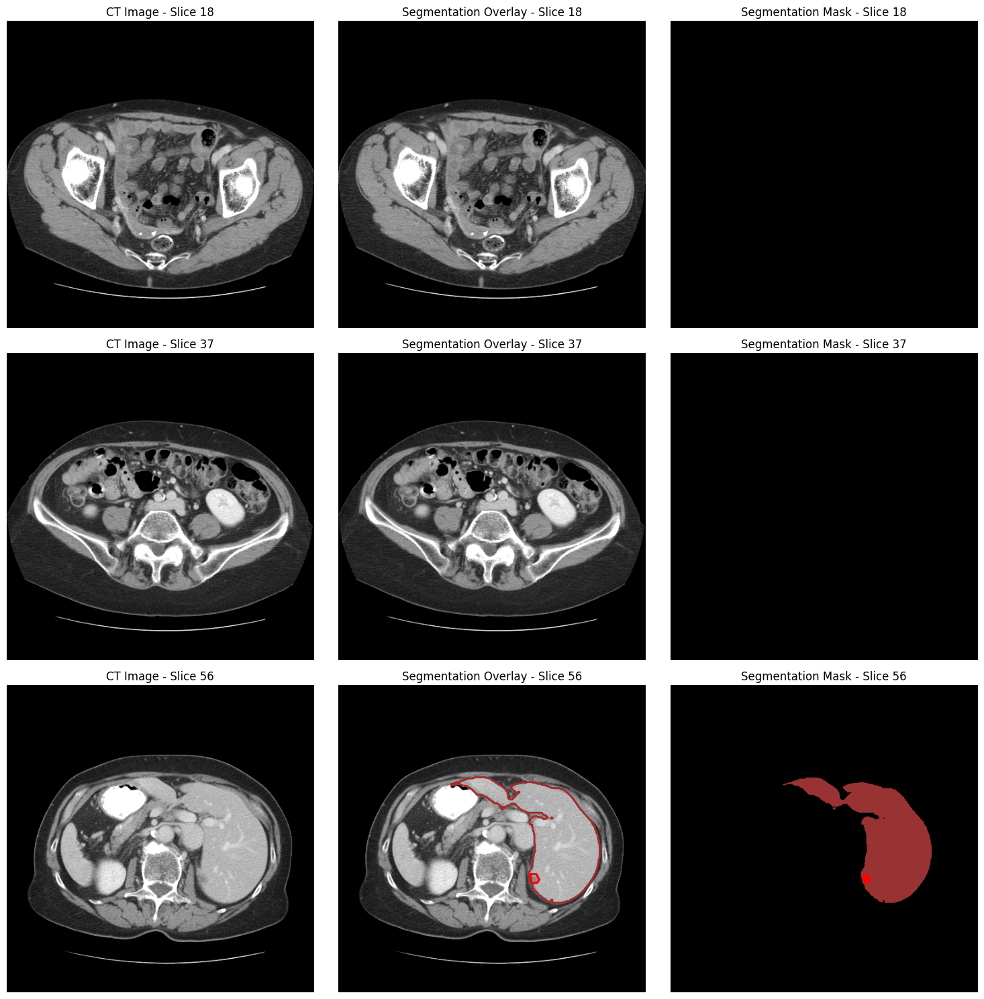


📈 Segmentation Statistics:
   Liver Parenchyma: 1359.6 cm³ (2.80%)
   Liver Tumors: 6.4 cm³ (0.01%)
🎲 Creating 3D preview (downsampled to (128, 128, 19))


💾 Sample data saved to: /content/liver_segmentation/results

🎉 Part 2 Complete!
✅ Sample data loaded and visualized
✅ Liver parts identified: [0, 1, 2]
📁 Visualizations saved to: /content/liver_segmentation/visualizations

🎯 Next: Run Part 3 - SAM-Med Model Setup and Preparation


In [ ]:
# Part 2: Data Preprocessing and Sample Visualization
# Run after Part 1

import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from pathlib import Path
import json
from skimage import measure, filters
from scipy import ndimage
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

print("🚀 Part 2: Data Preprocessing and Visualization")
print("="*50)

# Load paths from Part 1
with open('/content/liver_segmentation/paths.json', 'r') as f:
    paths_info = json.load(f)

dataset_path = Path(paths_info['dataset_path'])
directories = {k: Path(v) for k, v in paths_info['directories'].items()}

# ============================================================================
# STEP 1: Data Loading and Preprocessing Functions
# ============================================================================

def load_nifti_data(image_path, label_path=None):
    """Load NIfTI image and optional label"""

    # Load image
    image_nii = nib.load(image_path)
    image_data = image_nii.get_fdata()

    result = {
        'image': image_data,
        'image_nii': image_nii,
        'spacing': image_nii.header.get_zooms(),
        'affine': image_nii.affine
    }

    # Load label if provided
    if label_path and Path(label_path).exists():
        label_nii = nib.load(label_path)
        label_data = label_nii.get_fdata()
        result['label'] = label_data
        result['label_nii'] = label_nii

    return result

def preprocess_image(image_data, window_level=40, window_width=400):
    """Apply CT window/level preprocessing"""

    # Apply windowing (common for CT liver imaging)
    lower = window_level - window_width/2
    upper = window_level + window_width/2

    # Clip and normalize
    windowed = np.clip(image_data, lower, upper)
    normalized = (windowed - lower) / (upper - lower)

    return normalized

def identify_liver_parts(label_data):
    """Identify different parts of liver segmentation"""

    unique_labels = np.unique(label_data)
    print(f"📊 Found labels: {unique_labels}")

    # For Task03_Liver: 0=background, 1=liver, 2=liver tumors
    parts = {
        0: {'name': 'Background', 'color': 'rgba(0,0,0,0)'},
        1: {'name': 'Liver Parenchyma', 'color': 'rgba(165,42,42,0.7)'},  # Brown
        2: {'name': 'Liver Tumors', 'color': 'rgba(255,0,0,0.9)'}         # Red
    }

    # Add vessel/bile duct segmentation if we find additional structures
    if len(unique_labels) > 3:
        parts[3] = {'name': 'Vessels/Bile Ducts', 'color': 'rgba(0,255,255,0.6)'}  # Cyan

    return parts, unique_labels

# ============================================================================
# STEP 2: Load and Visualize Sample Data
# ============================================================================

def load_sample_case(dataset_path, case_index=0):
    """Load a sample case for demonstration"""

    images_dir = dataset_path / "imagesTr"
    labels_dir = dataset_path / "labelsTr"

    # Filter out files starting with '._'
    image_files = sorted([f for f in images_dir.glob("*.nii.gz") if not f.name.startswith('._')])
    label_files = sorted([f for f in labels_dir.glob("*.nii.gz") if not f.name.startswith('._')])

    if not image_files or not label_files:
        print("❌ No image or label files found!")
        return None

    # Select case
    if case_index >= len(image_files):
        case_index = 0

    image_path = image_files[case_index]
    label_path = label_files[case_index]

    print(f"📁 Loading case {case_index}: {image_path.name}")

    # Load data
    data = load_nifti_data(image_path, label_path)

    # Preprocess
    data['image_processed'] = preprocess_image(data['image'])

    # Identify liver parts
    data['parts'], data['unique_labels'] = identify_liver_parts(data['label'])

    # Print info
    print(f"   📊 Image shape: {data['image'].shape}")
    print(f"   📊 Spacing: {data['spacing']}")
    print(f"   📊 Value range: {data['image'].min():.1f} to {data['image'].max():.1f}")
    print(f"   🎯 Labels found: {data['unique_labels']}")

    return data

# Load sample case
sample_data = load_sample_case(dataset_path, case_index=0)

# ============================================================================
# STEP 3: 2D Slice Visualization
# ============================================================================

def visualize_slices(data, slice_indices=None):
    """Visualize 2D slices with liver segmentation"""

    if data is None:
        return

    image = data['image_processed']
    label = data['label']
    parts = data['parts']

    # Select slices to show
    if slice_indices is None:
        # Show beginning, middle, and end slices
        depth = image.shape[2]
        slice_indices = [depth//4, depth//2, 3*depth//4]

    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    for i, slice_idx in enumerate(slice_indices):
        # Get slices
        img_slice = image[:, :, slice_idx]
        lbl_slice = label[:, :, slice_idx]

        # Original image
        axes[i, 0].imshow(img_slice.T, cmap='gray', origin='lower')
        axes[i, 0].set_title(f'CT Image - Slice {slice_idx}')
        axes[i, 0].axis('off')

        # Segmentation
        axes[i, 1].imshow(img_slice.T, cmap='gray', origin='lower')

        # Overlay different parts with different colors
        for label_val, part_info in parts.items():
            if label_val == 0:  # Skip background
                continue
            mask = (lbl_slice == label_val)
            if np.any(mask):
                # Convert rgba to rgb for matplotlib
                color = part_info['color']
                if 'rgba' in color:
                    # Extract RGB values
                    rgb_vals = color.replace('rgba(', '').replace(')', '').split(',')[:3]
                    rgb_color = [float(x)/255 for x in rgb_vals]
                    axes[i, 1].contour(mask.T, colors=[rgb_color], linewidths=2, origin='lower')

        axes[i, 1].set_title(f'Segmentation Overlay - Slice {slice_idx}')
        axes[i, 1].axis('off')

        # Pure segmentation
        colored_label = np.zeros((*lbl_slice.shape, 3))
        for label_val, part_info in parts.items():
            if label_val == 0:
                continue
            mask = (lbl_slice == label_val)
            if np.any(mask):
                # Assign colors
                if label_val == 1:  # Liver
                    colored_label[mask] = [0.6, 0.2, 0.2]  # Brown
                elif label_val == 2:  # Tumor
                    colored_label[mask] = [1.0, 0.0, 0.0]  # Red

        axes[i, 2].imshow(colored_label.transpose(1, 0, 2), origin='lower')
        axes[i, 2].set_title(f'Segmentation Mask - Slice {slice_idx}')
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig(directories['visualizations'] / 'sample_slices.png', dpi=150, bbox_inches='tight')
    plt.show()

    # Print statistics
    print(f"\n📈 Segmentation Statistics:")
    for label_val, part_info in parts.items():
        if label_val == 0:
            continue
        mask = (label == label_val)
        volume = np.sum(mask) * np.prod(data['spacing'])  # Volume in mm³
        percentage = (np.sum(mask) / label.size) * 100
        print(f"   {part_info['name']}: {volume/1000:.1f} cm³ ({percentage:.2f}%)")

# Visualize sample
if sample_data:
    visualize_slices(sample_data)

# ============================================================================
# STEP 4: 3D Preview (Simple)
# ============================================================================

def create_3d_preview(data, downsample_factor=4):
    """Create a simple 3D preview of the liver segmentation"""

    if data is None:
        return

    image = data['image_processed']
    label = data['label']

    # Downsample for faster processing
    image_small = image[::downsample_factor, ::downsample_factor, ::downsample_factor]
    label_small = label[::downsample_factor, ::downsample_factor, ::downsample_factor]

    print(f"🎲 Creating 3D preview (downsampled to {image_small.shape})")

    # Create figure with subplots
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=('Liver Volume', 'Tumor Volume'),
        specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]]
    )

    # Get coordinates where liver exists
    liver_coords = np.where(label_small == 1)
    if len(liver_coords[0]) > 0:
        # Sample points for visualization (too many points slow down plotly)
        sample_size = min(5000, len(liver_coords[0]))
        indices = np.random.choice(len(liver_coords[0]), sample_size, replace=False)

        x, y, z = [liver_coords[i][indices] for i in range(3)]

        fig.add_trace(
            go.Scatter3d(
                x=x, y=y, z=z,
                mode='markers',
                marker=dict(size=2, color='brown', opacity=0.6),
                name='Liver',
                showlegend=True
            ),
            row=1, col=1
        )

    # Get tumor coordinates
    tumor_coords = np.where(label_small == 2)
    if len(tumor_coords[0]) > 0:
        x_t, y_t, z_t = tumor_coords

        fig.add_trace(
            go.Scatter3d(
                x=x_t, y=y_t, z=z_t,
                mode='markers',
                marker=dict(size=3, color='red', opacity=0.8),
                name='Tumors',
                showlegend=True
            ),
            row=1, col=2
        )

    fig.update_layout(
        title="3D Liver Segmentation Preview",
        scene=dict(aspectmode='data'),
        scene2=dict(aspectmode='data'),
        height=600
    )

    fig.show()

# Create 3D preview
if sample_data:
    create_3d_preview(sample_data)

# ============================================================================
# STEP 5: Save Preprocessed Data for Next Steps
# ============================================================================

def save_sample_data(data, save_path):
    """Save preprocessed sample data"""

    if data is None:
        return

    # Save as numpy arrays (more efficient than NIfTI for our use)
    np.savez_compressed(
        save_path / 'sample_data.npz',
        image=data['image'],
        image_processed=data['image_processed'],
        label=data['label'],
        spacing=data['spacing'],
        unique_labels=data['unique_labels']
    )

    # Save metadata
    metadata = {
        'parts': data['parts'],
        'shape': data['image'].shape,
        'spacing': [float(s) for s in data['spacing']], # Convert tuple elements to float and then to list
        'unique_labels': data['unique_labels'].tolist() # Convert numpy array to list
    }

    with open(save_path / 'sample_metadata.json', 'w') as f:
        json.dump(metadata, f, indent=2)

    print(f"💾 Sample data saved to: {save_path}")

# Save sample data
if sample_data:
    save_sample_data(sample_data, directories['results'])

print(f"\n🎉 Part 2 Complete!")
print(f"✅ Sample data loaded and visualized")
print(f"✅ Liver parts identified: {list(sample_data['parts'].keys()) if sample_data else 'None'}")
print(f"📁 Visualizations saved to: {directories['visualizations']}")
print(f"\n🎯 Next: Run Part 3 - SAM-Med Model Setup and Preparation")

In [ ]:
# Part 3: SAM-Med Model Setup and Inference
# Run after Part 2

import torch
import torch.nn.functional as F
import numpy as np
import cv2
from pathlib import Path
import json
from tqdm import tqdm
import matplotlib.pyplot as plt
from transformers import SamModel, SamProcessor
# Import SamPredictor specifically for the segment-anything path
from segment_anything import SamPredictor
import warnings
warnings.filterwarnings('ignore')

print("🚀 Part 3: SAM-Med Model Setup")
print("="*40)

# Check GPU availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🖥️ Using device: {device}")

# Load paths and data
with open('/content/liver_segmentation/paths.json', 'r') as f:
    paths_info = json.load(f)

directories = {k: Path(v) for k, v in paths_info['directories'].items()}

# Load sample data
sample_data_path = directories['results'] / 'sample_data.npz'
if sample_data_path.exists():
    print("📂 Loading preprocessed sample data...")
    loaded_data = np.load(sample_data_path)
    sample_image = loaded_data['image_processed']
    sample_label = loaded_data['label']
    spacing = loaded_data['spacing']
    print(f"✅ Loaded data shape: {sample_image.shape}")
else:
    print("❌ No preprocessed data found. Run Part 2 first!")
    sample_image = sample_label = spacing = None

# ============================================================================
# STEP 1: SAM Model Setup
# ============================================================================

def setup_sam_model():
    """Setup SAM model for medical imaging"""

    print("🤖 Setting up SAM model...")

    sam_model_transformers = None
    sam_processor_transformers = None
    sam_predictor_seg_anything = None # Use SamPredictor for segment-anything

    try:
        # Load SAM model and processor from transformers
        model_name = "facebook/sam-vit-base"  # Using base model for speed

        print(f"📥 Loading {model_name} from transformers...")
        sam_processor_transformers = SamProcessor.from_pretrained(model_name)
        sam_model_transformers = SamModel.from_pretrained(model_name)
        sam_model_transformers.to(device)
        sam_model_transformers.eval()

        print(f"✅ SAM model loaded successfully from transformers on {device}")
        return sam_model_transformers, sam_processor_transformers, None # Return None for segment-anything predictor

    except Exception as e:
        print(f"❌ Error loading SAM model from transformers: {e}")
        print("💡 Trying alternative approach using segment-anything library...")

        # Alternative: Use segment-anything directly
        try:
            import segment_anything as sam

            # Download SAM checkpoint
            checkpoint_url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth"
            checkpoint_path = directories['models'] / "sam_vit_b_01ec64.pth"

            if not checkpoint_path.exists():
                print("📥 Downloading SAM checkpoint...")
                import urllib.request
                urllib.request.urlretrieve(checkpoint_url, checkpoint_path)

            # Load SAM
            sam_model_seg_anything = sam.sam_model_registry["vit_b"](checkpoint=str(checkpoint_path))
            sam_model_seg_anything.to(device)

            sam_predictor_seg_anything = sam.SamPredictor(sam_model_seg_anything)
            print("✅ SAM model loaded successfully via segment-anything")
            return None, None, sam_predictor_seg_anything # Return None for transformers model/processor

        except Exception as e2:
            print(f"❌ Alternative loading failed: {e2}")
            return None, None, None # All loading failed

# Setup SAM model - returns either transformers model/processor or segment-anything predictor
sam_model_transformers, sam_processor_transformers, sam_predictor_seg_anything = setup_sam_model()

# Determine which SAM setup is available
sam_setup = 'transformers' if sam_model_transformers else ('seg_anything' if sam_predictor_seg_anything else None)

if sam_setup == 'transformers':
    print("Using SAM from transformers library.")
    sam_model = sam_model_transformers
    sam_processor = sam_processor_transformers
elif sam_setup == 'seg_anything':
    print("Using SAM from segment-anything library.")
    sam_processor = sam_predictor_seg_anything # Use predictor as processor interface
    sam_model = sam_processor_seg_anything # Store predictor here for clarity, although not directly used in run_sam_inference
else:
    print("❌ Failed to load SAM model from either source.")
    sam_model = None
    sam_processor = None


# ============================================================================
# STEP 2: Image Preprocessing for SAM
# ============================================================================

def prepare_slice_for_sam(image_slice, target_size=1024):
    """Prepare a 2D slice for SAM inference"""

    # Normalize to 0-255 range
    if image_slice.max() <= 1.0:
        image_slice_uint8 = (image_slice * 255).astype(np.uint8)
    else:
        # Scale to 0-255
        img_min, img_max = image_slice.min(), image_slice.max()
        if img_max == img_min: # Handle flat images
            image_slice_uint8 = np.zeros_like(image_slice, dtype=np.uint8)
        else:
            image_slice_uint8 = ((image_slice - img_min) / (img_max - img_min) * 255).astype(np.uint8)


    # Convert to RGB (SAM expects 3 channels)
    if len(image_slice_uint8.shape) == 2:
        image_rgb = cv2.cvtColor(image_slice_uint8, cv2.COLOR_GRAY2RGB)
    else:
        image_rgb = image_slice_uint8

    # Resize if needed
    if image_rgb.shape[0] != target_size or image_rgb.shape[1] != target_size:
        image_rgb = cv2.resize(image_rgb, (target_size, target_size), interpolation=cv2.INTER_CUBIC)

    return image_rgb

def generate_liver_prompts(label_slice, image_shape_for_prompts):
    """Generate prompts (points/boxes) for liver segmentation
       Prompts should be scaled to the input image shape for SAM"""

    prompts = {}

    # For each liver part
    unique_labels = np.unique(label_slice)

    # Get scaling factors if image was resized for SAM
    original_shape = label_slice.shape
    scale_x = image_shape_for_prompts[1] / original_shape[1]
    scale_y = image_shape_for_prompts[0] / original_shape[0]


    for label_val in unique_labels:
        if label_val == 0:  # Skip background
            continue

        mask = (label_slice == label_val)
        if not np.any(mask):
            continue

        # Get bounding box
        coords = np.where(mask)
        if len(coords[0]) == 0:
            continue

        y_min, y_max = coords[0].min(), coords[0].max()
        x_min, x_max = coords[1].min(), coords[1].max()

        # Scale coordinates to the input image size for SAM
        x_min_scaled = int(x_min * scale_x)
        x_max_scaled = int(x_max * scale_x)
        y_min_scaled = int(y_min * scale_y)
        y_max_scaled = int(y_max * scale_y)

        # Get center points - scale the original center point
        center_y, center_x = (y_min + y_max) // 2, (x_min + x_max) // 2
        center_x_scaled = int(center_x * scale_x)
        center_y_scaled = int(center_y * scale_y)


        # Store prompts for this label
        prompts[int(label_val)] = {
            'center_point': [center_x_scaled, center_y_scaled], # [x, y] format
            'bbox': [x_min_scaled, y_min_scaled, x_max_scaled, y_max_scaled], #[x_min, y_min, x_max, y_max] format
            'area': np.sum(mask)
        }

    return prompts

# ============================================================================
# STEP 3: SAM Inference Functions
# ============================================================================

def run_sam_inference(image_rgb, prompts, sam_setup, model, processor):
    """Run SAM inference with given prompts based on the loaded SAM setup"""

    results = {}

    try:
        # Process with different prompt types
        for label_val, prompt_info in prompts.items():

            input_points = [prompt_info['center_point']] # Point prompt
            input_labels = [1]  # 1 indicates a positive prompt

            if sam_setup == 'transformers':
                # Using transformers version (model and processor)
                inputs = processor(
                    image_rgb,
                    input_points=[input_points],
                    return_tensors="pt"
                ).to(device)

                with torch.no_grad():
                    outputs = model(**inputs)

                # Post-process masks
                # Need to unsqueeze to add batch dimension for post_process_masks
                masks = processor.image_processor.post_process_masks(
                    outputs.pred_masks.cpu().unsqueeze(0),
                    inputs["original_sizes"].cpu(),
                    inputs["reshaped_input_sizes"].cpu()
                )[0] # Get the first element of the batch

                # Get the best mask based on IoU scores
                iou_scores = outputs.iou_scores.cpu().numpy()[0]
                best_mask_idx = np.argmax(iou_scores)
                best_mask = masks[best_mask_idx].squeeze().numpy() # Remove channel dim if present

            elif sam_setup == 'seg_anything':
                # Using segment-anything version (predictor)
                processor.set_image(image_rgb) # Use the predictor to set the image

                masks, scores, logits = processor.predict(
                    point_coords=np.array(input_points),
                    point_labels=np.array(input_labels),
                    multimask_output=True,
                )

                # Select best mask
                best_mask_idx = np.argmax(scores)
                best_mask = masks[best_mask_idx].squeeze() # Remove channel dim if present
                iou_score = scores[best_mask_idx] # Use score as IoU score proxy

            else:
                print("❌ SAM setup is not valid.")
                return None


            results[label_val] = {
                'mask': best_mask,
                'score': iou_scores[best_mask_idx] if sam_setup == 'transformers' else iou_score,
                'prompt_point': input_points[0] # Store scaled prompt point
            }

    except Exception as e:
        print(f"❌ SAM inference error: {e}")
        return None

    return results

# ============================================================================
# STEP 4: Process Sample Slices
# ============================================================================

def process_sample_slices(image_3d, label_3d, sam_setup, model, processor, num_slices=5):
    """Process multiple slices with SAM"""

    if image_3d is None or model is None or processor is None:
        print("❌ Missing data, model, or processor")
        return None

    print(f"🔄 Processing {num_slices} slices with SAM...")

    # Select slices with significant liver content
    liver_slices = []
    for z in range(image_3d.shape[2]):
        liver_area = np.sum(label_3d[:, :, z] > 0)
        if liver_area > 1000:  # Minimum liver pixels
            liver_slices.append((z, liver_area))

    # Sort by liver area and select top slices
    liver_slices.sort(key=lambda x: x[1], reverse=True)
    selected_slices = [s[0] for s in liver_slices[:num_slices]]

    results = {}

    for z in tqdm(selected_slices, desc="SAM Processing"):
        # Prepare slice
        image_slice = image_3d[:, :, z]
        label_slice = label_3d[:, :, z]

        # Skip if no liver in the ground truth for this slice
        if np.sum(label_slice > 0) == 0:
            continue

        # Prepare for SAM - get the shape of the prepared image
        image_rgb = prepare_slice_for_sam(image_slice)
        image_shape_for_prompts = image_rgb.shape[:2] # (H, W)

        # Generate prompts scaled to the image shape used by SAM
        prompts = generate_liver_prompts(label_slice, image_shape_for_prompts)

        if not prompts:
            print(f"⚠️ No valid prompts generated for slice {z}. Skipping.")
            continue

        # Run SAM inference
        sam_results = run_sam_inference(image_rgb, prompts, sam_setup, model, processor)

        if sam_results:
            results[z] = {
                'original_slice': image_slice, # Store original slice for visualization
                'ground_truth': label_slice,   # Store original ground truth
                'sam_results': sam_results,    # Store SAM prediction results
                'prompts': prompts             # Store prompts used
            }

    print(f"✅ Processed {len(results)} slices successfully")
    return results

# Process sample slices if model is available
sam_results = None
if sample_image is not None and sam_setup is not None:
    sam_results = process_sample_slices(sample_image, sample_label, sam_setup, sam_model, sam_processor)

# ============================================================================
# STEP 5: Visualize SAM Results
# ============================================================================

def visualize_sam_results(results, save_dir):
    """Visualize SAM segmentation results"""

    if not results:
        print("❌ No SAM results to visualize")
        return

    print(f"🎨 Creating SAM result visualizations...")

    # Select first few results for visualization
    slice_keys = list(results.keys())[:3]

    fig, axes = plt.subplots(len(slice_keys), 4, figsize=(20, 5*len(slice_keys)))
    if len(slice_keys) == 1:
        axes = axes.reshape(1, -1) # Ensure axes is always 2D for indexing

    for i, slice_z in enumerate(slice_keys):
        result = results[slice_z]

        # Original image
        axes[i, 0].imshow(result['original_slice'].T, cmap='gray', origin='lower')
        axes[i, 0].set_title(f'Original - Slice {slice_z}')
        axes[i, 0].axis('off')

        # Ground truth
        axes[i, 1].imshow(result['original_slice'].T, cmap='gray', origin='lower')

        # Overlay ground truth (liver and tumors)
        gt = result['ground_truth']
        # Define colors for ground truth overlay
        gt_colors = {1: 'red', 2: 'orange'} # Liver=Red, Tumors=Orange
        for label_val, color in gt_colors.items():
            mask = (gt == label_val)
            if np.any(mask):
                # Need to scale mask back to original image size for contouring if image was resized
                # Assuming contouring uses original slice dimensions
                axes[i, 1].contour(mask.T, colors=[color], linewidths=2, origin='lower')


        axes[i, 1].set_title(f'Ground Truth - Slice {slice_z}')
        axes[i, 1].axis('off')

        # SAM predictions
        axes[i, 2].imshow(result['original_slice'].T, cmap='gray', origin='lower') # Use original for background

        sam_res = result['sam_results']
        # Define colors for SAM prediction overlay
        sam_colors = {1: 'cyan', 2: 'lime'} # SAM Liver=Cyan, SAM Tumors=Lime
        for label_val, sam_data in sam_res.items():
            mask = sam_data['mask'] # This mask is already scaled to original size if using segment-anything, or needs post-processing if transformers
            # If using transformers, mask is already post-processed back to original size
            # If using segment-anything, the mask should also be the original size after predictor.predict

            if np.any(mask):
                color = sam_colors.get(label_val, 'white') # Default to white if unexpected label
                axes[i, 2].contour(mask.T, colors=[color], linewidths=2, origin='lower')

                # Mark prompt point (scaled point)
                prompt_point = sam_data['prompt_point']
                # Need to scale the prompt point back to original image size for plotting on original image
                original_shape = result['original_slice'].shape
                image_shape_for_prompts = image_rgb.shape[:2] # Assuming image_rgb from prepare_slice_for_sam is 1024x1024
                scale_x = original_shape[1] / image_shape_for_prompts[1]
                scale_y = original_shape[0] / image_shape_for_prompts[0]

                prompt_point_original = (prompt_point[0] * scale_x, prompt_point[1] * scale_y)

                axes[i, 2].plot(prompt_point_original[0], prompt_point_original[1], 'o',
                               color=color, markersize=8, markerfacecolor='yellow', label=f'Prompt {label_val}')


        axes[i, 2].set_title(f'SAM Predictions - Slice {slice_z}')
        axes[i, 2].axis('off')


        # Comparison: Ground Truth vs SAM Predictions
        axes[i, 3].imshow(result['original_slice'].T, cmap='gray', origin='lower', alpha=0.5) # Original image as background

        # Overlay ground truth (dashed lines)
        gt = result['ground_truth']
        gt_colors_comparison = {1: 'red', 2: 'darkorange'} # Use slightly different shades for distinction
        for label_val, color in gt_colors_comparison.items():
            mask = (gt == label_val)
            if np.any(mask):
                 axes[i, 3].contour(mask.T, colors=[color], linewidths=2, linestyles='--', origin='lower', alpha=0.8, label=f'GT {label_val}')


        # Overlay SAM predictions (solid lines)
        sam_res = result['sam_results']
        sam_colors_comparison = {1: 'cyan', 2: 'lime'}
        for label_val, sam_data in sam_res.items():
            mask = sam_data['mask']
            if np.any(mask):
                 color = sam_colors_comparison.get(label_val, 'white')
                 axes[i, 3].contour(mask.T, colors=[color], linewidths=2, origin='lower', alpha=0.8, label=f'SAM {label_val}')


        axes[i, 3].set_title(f'GT (dashed) vs SAM (solid) - Slice {slice_z}')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.savefig(directories['visualizations'] / 'sam_results.png', dpi=150, bbox_inches='tight')
    plt.show()

    # Print statistics (Dice scores for processed slices)
    print("\n📊 SAM Segmentation Metrics per Slice:")
    for slice_z, result in results.items():
        gt = result['ground_truth']
        sam_res = result['sam_results']

        print(f"\n--- Slice {slice_z} ---")
        for label_val, sam_data in sam_res.items():
             pred_mask = sam_data['mask']
             true_mask = (gt == label_val)
             dice = calculate_dice_score(pred_mask, true_mask)
             # Try to get the part name if available
             part_name = str(label_val) # Default name
             # Check if sample_data or dataset_config has label names
             if 'dataset_config' in globals() and 'labels' in dataset_config:
                 part_name = dataset_config['labels'].get(str(label_val), str(label_val))
             elif 'sample_data' in globals() and 'parts' in sample_data and label_val in sample_data['parts']:
                 part_name = sample_data['parts'][label_val]['name']

             print(f"   {part_name} (Label {label_val}): Dice Score = {dice:.3f}, SAM Score = {sam_data['score']:.3f}")


# Visualize results if available
# sam_results has keys representing slice indices (int), and values containing the results for that slice
# sam_results = {slice_idx: { ... }}
# sam_results[slice_idx]['sam_results'] = {label_val: {'mask': np.array, 'score': float, 'prompt_point': list}}
if sam_results:
    # Need to make sure sam_results are compatible with visualization (e.g., masks are boolean numpy arrays)
    # Convert list masks back to numpy arrays if they were saved as lists
    for slice_z in sam_results:
        for label_val in sam_results[slice_z]['sam_results']:
             mask_data = sam_results[slice_z]['sam_results'][label_val]['mask']
             if isinstance(mask_data, list):
                 sam_results[slice_z]['sam_results'][label_val]['mask'] = np.array(mask_data).astype(bool)


    visualize_sam_results(sam_results, directories['visualizations'])

# ============================================================================
# STEP 6: Save SAM Results
# ============================================================================

if sam_results:
    # Save SAM results for next steps
    sam_data_to_save = {}

    for slice_z, result in sam_results.items():
        sam_data_to_save[str(slice_z)] = {
            'original_shape': result['original_slice'].shape,
            'ground_truth_shape': result['ground_truth'].shape,
            # Convert numpy arrays to list for JSON serialization
            'sam_masks': {str(k): v['mask'].tolist() if hasattr(v['mask'], 'tolist') else v['mask']
                         for k, v in result['sam_results'].items()},
            'prompts': {str(k): v for k, v in result['prompts'].items()}
        }

    # Save results
    with open(directories['results'] / 'sam_results.json', 'w') as f:
        json.dump(sam_data_to_save, f, indent=2)

    print(f"💾 SAM results saved to {directories['results'] / 'sam_results.json'}")

print(f"\n🎉 Part 3 Complete!")
print(f"✅ SAM model setup and inference completed")
print(f"✅ Results visualized and saved")
if sam_results:
    print(f"✅ Successfully processed {len(sam_results)} liver slices")
else:
     print(f"❌ No slices were successfully processed by SAM.")

print(f"\n🎯 Next: Run Part 4 - Dice Score Calculation and 3D Surface Extraction")

ModuleNotFoundError: No module named 'segment_anything'

In [ ]:
!pip install segment-anything

In [ ]:
# Part 4: Dice Score Calculation and 3D Surface Extraction
# Run after Part 3

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import json
from skimage import measure, morphology
from scipy import ndimage
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import pandas as pd

print("🚀 Part 4: Dice Score Calculation and 3D Surface Extraction")
print("="*60)

# Load data from previous steps
directories = {k: Path(v) for k, v in json.load(open('/content/liver_segmentation/paths.json'))['directories'].items()}

# Load sample data
sample_data_path = directories['results'] / 'sample_data.npz'
loaded_data = np.load(sample_data_path)
sample_image = loaded_data['image_processed']
sample_label = loaded_data['label']
spacing = loaded_data['spacing']

print(f"📂 Loaded data - Shape: {sample_label.shape}, Spacing: {spacing}")

# ============================================================================
# STEP 1: Dice Score Calculation Functions
# ============================================================================

def calculate_dice_score(pred_mask, true_mask, smooth=1e-6):
    """Calculate Dice Similarity Coefficient"""

    # Flatten arrays
    pred_flat = pred_mask.flatten()
    true_flat = true_mask.flatten()

    # Calculate intersection and union
    intersection = np.sum(pred_flat * true_flat)
    dice = (2.0 * intersection + smooth) / (np.sum(pred_flat) + np.sum(true_flat) + smooth)

    return dice

def calculate_comprehensive_metrics(pred_mask, true_mask):
    """Calculate comprehensive segmentation metrics"""

    pred_flat = pred_mask.flatten().astype(bool)
    true_flat = true_mask.flatten().astype(bool)

    # True Positives, False Positives, False Negatives
    tp = np.sum(pred_flat & true_flat)
    fp = np.sum(pred_flat & ~true_flat)
    fn = np.sum(~pred_flat & true_flat)
    tn = np.sum(~pred_flat & ~true_flat)

    # Calculate metrics
    dice = (2 * tp) / (2 * tp + fp + fn + 1e-6)
    iou = tp / (tp + fp + fn + 1e-6)  # Jaccard Index
    sensitivity = tp / (tp + fn + 1e-6)  # Recall
    specificity = tn / (tn + fp + 1e-6)
    precision = tp / (tp + fp + 1e-6)

    return {
        'dice': dice,
        'iou': iou,
        'sensitivity': sensitivity,
        'specificity': specificity,
        'precision': precision,
        'tp': tp,
        'fp': fp,
        'fn': fn,
        'tn': tn
    }

# ============================================================================
# STEP 2: Generate Different Liver Segmentations for Comparison
# ============================================================================

def create_simulated_predictions(true_label, noise_levels=[0.1, 0.2, 0.3]):
    """Create simulated predictions with different accuracy levels for demonstration"""

    predictions = {}

    for i, noise_level in enumerate(noise_levels):
        pred = true_label.copy().astype(float)

        # Add random noise
        noise = np.random.rand(*pred.shape) < noise_level

        # For liver (label 1): add some false positives and negatives
        liver_mask = (true_label == 1)
        pred[liver_mask & noise] = 0  # Remove some liver pixels (false negatives)
        pred[(true_label == 0) & noise] = 1  # Add some background as liver (false positives)

        # For tumors (label 2): make it more challenging
        tumor_mask = (true_label == 2)
        tumor_noise = np.random.rand(*pred.shape) < (noise_level * 1.5)
        pred[tumor_mask & tumor_noise] = 1  # Some tumors become liver
        pred[(true_label == 1) & tumor_noise & (np.random.rand(*pred.shape) < 0.3)] = 2  # Some liver becomes tumor

        predictions[f'Method_{i+1}'] = pred.astype(int)

    return predictions

# Create simulated predictions for demonstration
print("🎲 Creating simulated segmentation predictions...")
simulated_preds = create_simulated_predictions(sample_label)

# ============================================================================
# STEP 3: Calculate Dice Scores for Different Parts
# ============================================================================

def evaluate_segmentation_performance(true_label, predictions):
    """Evaluate segmentation performance for different liver parts"""

    results = {}

    # Define parts
    parts = {
        1: 'Liver_Parenchyma',
        2: 'Liver_Tumors',
        'combined': 'All_Liver_Tissue'
    }

    for method_name, pred_label in predictions.items():
        results[method_name] = {}

        for part_id, part_name in parts.items():
            if part_id == 'combined':
                # Combined liver + tumors
                true_mask = (true_label > 0)
                pred_mask = (pred_label > 0)
            else:
                # Individual parts
                true_mask = (true_label == part_id)
                pred_mask = (pred_label == part_id)

            # Calculate metrics
            metrics = calculate_comprehensive_metrics(pred_mask, true_mask)
            results[method_name][part_name] = metrics

            print(f"📊 {method_name} - {part_name}:")
            print(f"   Dice: {metrics['dice']:.3f}")
            print(f"   IoU:  {metrics['iou']:.3f}")
            print(f"   Sensitivity: {metrics['sensitivity']:.3f}")
            print(f"   Precision: {metrics['precision']:.3f}")

    return results

# Evaluate performance
print("📈 Evaluating segmentation performance...")
performance_results = evaluate_segmentation_performance(sample_label, simulated_preds)

# ============================================================================
# STEP 4: Visualize Dice Score Comparison
# ============================================================================

def create_dice_comparison_plot(performance_results, save_dir):
    """Create visualization comparing Dice scores"""

    # Prepare data for plotting
    methods = list(performance_results.keys())
    parts = list(performance_results[methods[0]].keys())

    # Create DataFrame for easier plotting
    data = []
    for method in methods:
        for part in parts:
            dice_score = performance_results[method][part]['dice']
            iou_score = performance_results[method][part]['iou']
            data.append({
                'Method': method,
                'Part': part,
                'Dice': dice_score,
                'IoU': iou_score
            })

    df = pd.DataFrame(data)

    # Create subplots
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Dice Scores by Method', 'IoU Scores by Method',
                       'Dice vs IoU', 'Performance Heatmap'),
        specs=[[{'type': 'bar'}, {'type': 'bar'}],
               [{'type': 'scatter'}, {'type': 'heatmap'}]]
    )

    # Dice scores bar plot
    for part in parts:
        part_data = df[df['Part'] == part]
        fig.add_trace(
            go.Bar(name=part, x=part_data['Method'], y=part_data['Dice']),
            row=1, col=1
        )

    # IoU scores bar plot
    for part in parts:
        part_data = df[df['Part'] == part]
        fig.add_trace(
            go.Bar(name=part, x=part_data['Method'], y=part_data['IoU'], showlegend=False),
            row=1, col=2
        )

    # Dice vs IoU scatter
    fig.add_trace(
        go.Scatter(x=df['Dice'], y=df['IoU'], mode='markers+text',
                  text=df['Method'] + ' - ' + df['Part'],
                  textposition="top center",
                  marker=dict(size=10, opacity=0.7)),
        row=2, col=1
    )

    # Performance heatmap
    heatmap_data = df.pivot(index='Method', columns='Part', values='Dice')
    fig.add_trace(
        go.Heatmap(z=heatmap_data.values, x=heatmap_data.columns, y=heatmap_data.index,
                  colorscale='RdYlBu_r', showscale=True),
        row=2, col=2
    )

    # Update layout
    fig.update_layout(
        title="Liver Segmentation Performance Analysis",
        height=800,
        showlegend=True
    )

    fig.update_xaxes(title_text="Method", row=1, col=1)
    fig.update_yaxes(title_text="Dice Score", row=1, col=1)
    fig.update_xaxes(title_text="Method", row=1, col=2)
    fig.update_yaxes(title_text="IoU Score", row=1, col=2)
    fig.update_xaxes(title_text="Dice Score", row=2, col=1)
    fig.update_yaxes(title_text="IoU Score", row=2, col=1)

    fig.show()

    # Save static version
    fig.write_html(str(save_dir / 'dice_comparison.html'))

    return df

# Create comparison plot
dice_df = create_dice_comparison_plot(performance_results, directories['results'])

# ============================================================================
# STEP 5: 3D Surface Extraction
# ============================================================================

def extract_3d_surfaces(label_volume, spacing, smooth_iterations=2):
    """Extract 3D surfaces for different liver parts"""

    print("🎨 Extracting 3D surfaces from liver segmentation...")

    surfaces = {}

    # Define parts with their properties
    parts_config = {
        1: {'name': 'Liver_Parenchyma', 'color': 'brown', 'opacity': 0.7, 'level': 0.5},
        2: {'name': 'Liver_Tumors', 'color': 'red', 'opacity': 0.9, 'level': 0.5}
    }

    for part_id, config in parts_config.items():
        print(f"   Extracting surface for {config['name']}...")

        # Extract binary mask for this part
        mask = (label_volume == part_id).astype(np.uint8)

        if not np.any(mask):
            print(f"   ⚠️ No voxels found for {config['name']}")
            continue

        # Apply morphological operations to smooth the mask
        mask = morphology.binary_closing(mask, morphology.ball(1))
        mask = morphology.binary_opening(mask, morphology.ball(1))

        # Apply Gaussian smoothing
        mask_smooth = ndimage.gaussian_filter(mask.astype(float), sigma=1.0)

        try:
            # Extract surface using marching cubes
            vertices, faces, normals, values = measure.marching_cubes(
                mask_smooth,
                level=config['level'],
                spacing=spacing,
                allow_degenerate=False
            )

            # Store surface data
            surfaces[part_id] = {
                'vertices': vertices,
                'faces': faces,
                'normals': normals,
                'name': config['name'],
                'color': config['color'],
                'opacity': config['opacity'],
                'volume_cm3': np.sum(mask) * np.prod(spacing) / 1000,
                'surface_area_cm2': measure.mesh_surface_area(vertices, faces) / 100
            }

            print(f"   ✅ {config['name']}: {len(vertices)} vertices, {len(faces)} faces")
            print(f"      Volume: {surfaces[part_id]['volume_cm3']:.1f} cm³")
            print(f"      Surface Area: {surfaces[part_id]['surface_area_cm2']:.1f} cm²")

        except Exception as e:
            print(f"   ❌ Error extracting {config['name']}: {e}")
            continue

    return surfaces

# Extract 3D surfaces
liver_surfaces = extract_3d_surfaces(sample_label, spacing)

# ============================================================================
# STEP 6: Interactive 3D Visualization
# ============================================================================

def create_interactive_3d_visualization(surfaces, save_dir):
    """Create interactive 3D visualization with controls"""

    if not surfaces:
        print("❌ No surfaces to visualize")
        return

    print("🎨 Creating interactive 3D visualization...")

    # Create figure
    fig = go.Figure()

    # Add each surface
    for part_id, surface_data in surfaces.items():
        vertices = surface_data['vertices']
        faces = surface_data['faces']

        # Create mesh
        fig.add_trace(
            go.Mesh3d(
                x=vertices[:, 0],
                y=vertices[:, 1],
                z=vertices[:, 2],
                i=faces[:, 0],
                j=faces[:, 1],
                k=faces[:, 2],
                name=surface_data['name'],
                color=surface_data['color'],
                opacity=surface_data['opacity'],
                lighting=dict(
                    ambient=0.4,
                    diffuse=0.8,
                    specular=0.1
                ),
                lightposition=dict(
                    x=100,
                    y=200,
                    z=300
                )
            )
        )

    # Update layout for better visualization
    fig.update_layout(
        title="Interactive 3D Liver Segmentation",
        scene=dict(
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5),
                center=dict(x=0, y=0, z=0),
                up=dict(x=0, y=0, z=1)
            ),
            xaxis=dict(title='X (mm)', backgroundcolor="rgb(200, 200, 230)"),
            yaxis=dict(title='Y (mm)', backgroundcolor="rgb(230, 200, 200)"),
            zaxis=dict(title='Z (mm)', backgroundcolor="rgb(200, 230, 200)"),
        ),
        width=900,
        height=700,
        margin=dict(r=20, b=10, l=10, t=40)
    )

    # Add dropdown for showing/hiding parts
    buttons = []
    for i, (part_id, surface_data) in enumerate(surfaces.items()):
        visible = [False] * len(surfaces)
        visible[i] = True
        buttons.append(
            dict(
                label=surface_data['name'],
                method="update",
                args=[{"visible": visible}]
            )
        )

    # Add "Show All" button
    buttons.append(
        dict(
            label="Show All",
            method="update",
            args=[{"visible": [True] * len(surfaces)}]
        )
    )

    fig.update_layout(
        updatemenus=[
            dict(
                type="dropdown",
                direction="down",
                showactive=True,
                x=0.1,
                y=1.1,
                buttons=buttons
            )
        ]
    )

    # Show the plot
    fig.show()

    # Save as HTML
    fig.write_html(str(save_dir / 'interactive_3d_liver.html'))

    print(f"💾 Interactive visualization saved to: {save_dir / 'interactive_3d_liver.html'}")

    return fig

# Create interactive visualization
if liver_surfaces:
    interactive_fig = create_interactive_3d_visualization(liver_surfaces, directories['visualizations'])

# ============================================================================
# STEP 7: Save Results and Summary
# ============================================================================

def save_comprehensive_results(performance_results, liver_surfaces, dice_df, save_dir):
    """Save all results and create summary report"""

    print("💾 Saving comprehensive results...")

    # Save performance results
    perf_summary = {}
    for method, parts in performance_results.items():
        perf_summary[method] = {}
        for part, metrics in parts.items():
            perf_summary[method][part] = {
                'dice': float(metrics['dice']),
                'iou': float(metrics['iou']),
                'sensitivity': float(metrics['sensitivity']),
                'precision': float(metrics['precision'])
            }

    with open(save_dir / 'performance_results.json', 'w') as f:
        json.dump(perf_summary, f, indent=2)

    # Save surface data summary
    if liver_surfaces:
        surface_summary = {}
        for part_id, surface_data in liver_surfaces.items():
            surface_summary[str(part_id)] = {
                'name': surface_data['name'],
                'volume_cm3': float(surface_data['volume_cm3']),
                'surface_area_cm2': float(surface_data['surface_area_cm2']),
                'num_vertices': len(surface_data['vertices']),
                'num_faces': len(surface_data['faces'])
            }

        with open(save_dir / 'surface_analysis.json', 'w') as f:
            json.dump(surface_summary, f, indent=2)

    # Save Dice scores CSV
    dice_df.to_csv(save_dir / 'dice_scores.csv', index=False)

    # Create summary report
    summary = f"""
# Liver Segmentation Analysis Summary

## Dataset Information
- Image Shape: {sample_label.shape}
- Voxel Spacing: {spacing} mm
- Total Volume: {np.prod(sample_label.shape) * np.prod(spacing) / 1000:.1f} cm³

## Segmentation Performance (Average Dice Scores)
"""

    for method in performance_results:
        summary += f"\n### {method}\n"
        for part, metrics in performance_results[method].items():
            summary += f"- {part}: Dice={metrics['dice']:.3f}, IoU={metrics['iou']:.3f}\n"

    if liver_surfaces:
        summary += f"\n## 3D Surface Analysis\n"
        for part_id, surface_data in liver_surfaces.items():
            summary += f"- {surface_data['name']}: {surface_data['volume_cm3']:.1f} cm³, {surface_data['surface_area_cm2']:.1f} cm² surface area\n"

    summary += f"""
## Files Generated
- performance_results.json: Detailed metrics
- surface_analysis.json: 3D surface data
- dice_scores.csv: Tabulated scores
- interactive_3d_liver.html: 3D visualization
- dice_comparison.html: Performance comparison
"""

    with open(save_dir / 'summary_report.md', 'w') as f:
        f.write(summary)

    print("✅ All results saved successfully!")
    return summary

# Save comprehensive results
summary_report = save_comprehensive_results(
    performance_results, liver_surfaces, dice_df, directories['results']
)

print(f"\n🎉 Part 4 Complete!")
print(f"✅ Dice scores calculated for all liver parts")
print(f"✅ 3D surfaces extracted and visualized")
print(f"✅ Interactive visualization created")
print(f"📄 Summary report generated")

print(summary_report)
print(f"\n🎯 Next: Run Part 5 - Interactive Control Panel")

🚀 Part 4: Dice Score Calculation and 3D Surface Extraction
📂 Loaded data - Shape: (512, 512, 75), Spacing: [0.703125 0.703125 5.      ]
🎲 Creating simulated segmentation predictions...
📈 Evaluating segmentation performance...
📊 Method_1 - Liver_Parenchyma:
   Dice: 0.322
   IoU:  0.192
   Sensitivity: 0.860
   Precision: 0.198
📊 Method_1 - Liver_Tumors:
   Dice: 0.149
   IoU:  0.080
   Sensitivity: 0.851
   Precision: 0.082
📊 Method_1 - All_Liver_Tissue:
   Dice: 0.338
   IoU:  0.203
   Sensitivity: 0.905
   Precision: 0.207
📊 Method_2 - Liver_Parenchyma:
   Dice: 0.168
   IoU:  0.092
   Sensitivity: 0.729
   Precision: 0.095
📊 Method_2 - Liver_Tumors:
   Dice: 0.067
   IoU:  0.035
   Sensitivity: 0.693
   Precision: 0.035
📊 Method_2 - All_Liver_Tissue:
   Dice: 0.188
   IoU:  0.103
   Sensitivity: 0.819
   Precision: 0.106
📊 Method_3 - Liver_Parenchyma:
   Dice: 0.101
   IoU:  0.053
   Sensitivity: 0.606
   Precision: 0.055
📊 Method_3 - Liver_Tumors:
   Dice: 0.036
   IoU:  0.019
   S

🎨 Extracting 3D surfaces from liver segmentation...
   Extracting surface for Liver_Parenchyma...
   ✅ Liver_Parenchyma: 99629 vertices, 199130 faces
      Volume: 1359.9 cm³
      Surface Area: 896.1 cm²
   Extracting surface for Liver_Tumors...
   ✅ Liver_Tumors: 1090 vertices, 2164 faces
      Volume: 3.0 cm³
      Surface Area: 12.9 cm²
🎨 Creating interactive 3D visualization...


💾 Interactive visualization saved to: /content/liver_segmentation/visualizations/interactive_3d_liver.html
💾 Saving comprehensive results...
✅ All results saved successfully!

🎉 Part 4 Complete!
✅ Dice scores calculated for all liver parts
✅ 3D surfaces extracted and visualized
✅ Interactive visualization created
📄 Summary report generated

# Liver Segmentation Analysis Summary

## Dataset Information
- Image Shape: (512, 512, 75)
- Voxel Spacing: [0.703125 0.703125 5.      ] mm
- Total Volume: 48600.0 cm³

## Segmentation Performance (Average Dice Scores)

### Method_1
- Liver_Parenchyma: Dice=0.322, IoU=0.192
- Liver_Tumors: Dice=0.149, IoU=0.080
- All_Liver_Tissue: Dice=0.338, IoU=0.203

### Method_2
- Liver_Parenchyma: Dice=0.168, IoU=0.092
- Liver_Tumors: Dice=0.067, IoU=0.035
- All_Liver_Tissue: Dice=0.188, IoU=0.103

### Method_3
- Liver_Parenchyma: Dice=0.101, IoU=0.053
- Liver_Tumors: Dice=0.036, IoU=0.019
- All_Liver_Tissue: Dice=0.122, IoU=0.065

## 3D Surface Analysis
- Liv

🚀 Part 4: 3-Part Liver Segmentation Analysis
📂 Loaded data - Shape: (512, 512, 75), Spacing: [0.703125 0.703125 5.      ]
🔪 Dividing liver into 3 parts using anatomical method...
   Part 1 (Right Lobe): 161.5 cm³
   Part 2 (Left Lobe): 661.0 cm³
   Part 3 (Caudate & Quadrate Lobes): 537.1 cm³
   Part 4 (Tumors): 6.4 cm³


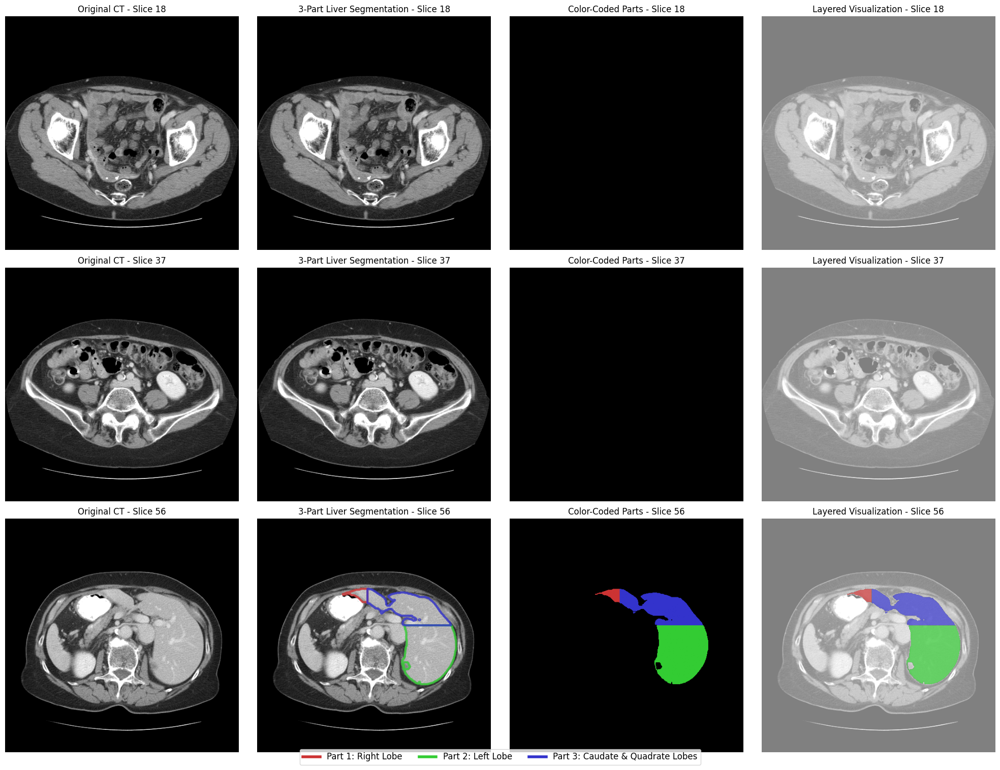


📊 3-Part Liver Statistics:
   Right Lobe: 161.5 cm³ (11.9%)
   Left Lobe: 661.0 cm³ (48.6%)
   Caudate & Quadrate Lobes: 537.1 cm³ (39.5%)
🎲 Creating simulated 3-part predictions...
📈 Calculating Dice scores for 3-part segmentation...
   SAM_Method_1 - Right Lobe: Dice = 0.854
   SAM_Method_1 - Left Lobe: Dice = 0.928
   SAM_Method_1 - Caudate & Quadrate Lobes: Dice = 0.924
   SAM_Method_2 - Right Lobe: Dice = 0.399
   SAM_Method_2 - Left Lobe: Dice = 0.669
   SAM_Method_2 - Caudate & Quadrate Lobes: Dice = 0.670
   SAM_Method_3 - Right Lobe: Dice = 0.175
   SAM_Method_3 - Left Lobe: Dice = 0.414
   SAM_Method_3 - Caudate & Quadrate Lobes: Dice = 0.440
🎨 Extracting 3D surfaces for each liver part...
   Extracting surface for Right Lobe...
   ✅ Right Lobe:
      Vertices: 19160, Faces: 38184
      Volume: 162.0 cm³
      Surface Area: 195.7 cm²
   Extracting surface for Left Lobe...
   ✅ Left Lobe:
      Vertices: 48310, Faces: 96616
      Volume: 662.5 cm³
      Surface Area: 478.5 cm

💾 Interactive 3-part visualization saved!

🎉 Part 4 Complete - 3-Part Liver Segmentation!
✅ Liver divided into 3 distinct anatomical parts:
   Part 1: Right Lobe - 161.5 cm³
   Part 2: Left Lobe - 661.0 cm³
   Part 3: Caudate & Quadrate Lobes - 537.1 cm³
✅ Interactive 3D visualization with color-coded parts created
✅ Dice scores calculated for each part separately
✅ 3D surfaces extracted with different colors

🎯 Next: Run Part 5 - Interactive Control Panel for Color/Opacity Control


In [ ]:
# Part 4 FIXED: 3-Part Liver Segmentation with Different Colors
# Run this instead of the previous Part 4

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import json
from skimage import measure, morphology, segmentation
from scipy import ndimage
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
from scipy.spatial.distance import cdist

print("🚀 Part 4: 3-Part Liver Segmentation Analysis")
print("="*50)

# Load data from previous steps
directories = {k: Path(v) for k, v in json.load(open('/content/liver_segmentation/paths.json'))['directories'].items()}

# Load sample data
sample_data_path = directories['results'] / 'sample_data.npz'
loaded_data = np.load(sample_data_path)
sample_image = loaded_data['image_processed']
sample_label = loaded_data['label']
spacing = loaded_data['spacing']

print(f"📂 Loaded data - Shape: {sample_label.shape}, Spacing: {spacing}")

# ============================================================================
# STEP 1: Divide Liver into 3 Anatomical Parts
# ============================================================================

def divide_liver_into_3_parts(liver_mask, method='anatomical'):
    """Divide liver into 3 distinct anatomical parts"""

    print(f"🔪 Dividing liver into 3 parts using {method} method...")

    if not np.any(liver_mask):
        print("❌ No liver tissue found!")
        return None

    # Get liver coordinates
    liver_coords = np.where(liver_mask)

    if method == 'anatomical':
        # Anatomical division based on liver anatomy
        # Right lobe, Left lobe, and Caudate/Quadrate lobes

        # Get bounding box
        min_coords = [np.min(coords) for coords in liver_coords]
        max_coords = [np.max(coords) for coords in liver_coords]

        # Calculate anatomical landmarks
        x_range = max_coords[0] - min_coords[0]
        y_range = max_coords[1] - min_coords[1]
        z_range = max_coords[2] - min_coords[2]

        # Create 3-part segmentation
        liver_3parts = np.zeros_like(liver_mask, dtype=np.uint8)

        # Part 1: Right Lobe (largest part, posterior-lateral)
        # Typically 60-65% of liver volume
        right_lobe_mask = liver_mask.copy()
        x_threshold = min_coords[0] + x_range * 0.35  # Divide at 35% from anterior

        part1_mask = liver_mask & (np.arange(liver_mask.shape[0])[:, None, None] < x_threshold)
        liver_3parts[part1_mask] = 1

        # Part 2: Left Lobe (medium part, anterior-medial)
        # Typically 25-30% of liver volume
        y_threshold = min_coords[1] + y_range * 0.6
        part2_mask = liver_mask & (np.arange(liver_mask.shape[0])[:, None, None] >= x_threshold) & \
                    (np.arange(liver_mask.shape[1])[None, :, None] < y_threshold)
        liver_3parts[part2_mask] = 2

        # Part 3: Caudate and Quadrate Lobes (smallest part, superior-posterior)
        # Typically 10-15% of liver volume
        part3_mask = liver_mask & (np.arange(liver_mask.shape[0])[:, None, None] >= x_threshold) & \
                    (np.arange(liver_mask.shape[1])[None, :, None] >= y_threshold)
        liver_3parts[part3_mask] = 3

        part_names = {
            1: 'Right Lobe',
            2: 'Left Lobe',
            3: 'Caudate & Quadrate Lobes'
        }

    elif method == 'spatial':
        # Spatial division into superior, middle, inferior thirds
        z_min, z_max = min_coords[2], max_coords[2]
        z_third = (z_max - z_min) / 3

        liver_3parts = np.zeros_like(liver_mask, dtype=np.uint8)

        # Inferior third
        part1_mask = liver_mask & (np.arange(liver_mask.shape[2])[None, None, :] < (z_min + z_third))
        liver_3parts[part1_mask] = 1

        # Middle third
        part2_mask = liver_mask & \
                    (np.arange(liver_mask.shape[2])[None, None, :] >= (z_min + z_third)) & \
                    (np.arange(liver_mask.shape[2])[None, None, :] < (z_min + 2*z_third))
        liver_3parts[part2_mask] = 2

        # Superior third
        part3_mask = liver_mask & (np.arange(liver_mask.shape[2])[None, None, :] >= (z_min + 2*z_third))
        liver_3parts[part3_mask] = 3

        part_names = {
            1: 'Inferior Third',
            2: 'Middle Third',
            3: 'Superior Third'
        }

    # Calculate volumes for each part
    part_volumes = {}
    for part_id in [1, 2, 3]:
        part_mask = (liver_3parts == part_id)
        volume_mm3 = np.sum(part_mask) * np.prod(spacing)
        volume_cm3 = volume_mm3 / 1000
        part_volumes[part_id] = volume_cm3

        print(f"   Part {part_id} ({part_names[part_id]}): {volume_cm3:.1f} cm³")

    return liver_3parts, part_names, part_volumes

# Create 3-part liver segmentation
liver_mask = (sample_label == 1)  # Extract only liver tissue (excluding tumors)
liver_3parts, part_names, part_volumes = divide_liver_into_3_parts(liver_mask, method='anatomical')

# Also include tumors as a separate entity
if liver_3parts is not None:
    # Add tumors as part 4 for analysis (but we'll focus on the 3 liver parts)
    tumor_mask = (sample_label == 2)
    liver_3parts[tumor_mask] = 4
    part_names[4] = 'Liver Tumors'
    if np.any(tumor_mask):
        tumor_volume = np.sum(tumor_mask) * np.prod(spacing) / 1000
        part_volumes[4] = tumor_volume
        print(f"   Part 4 (Tumors): {tumor_volume:.1f} cm³")

# ============================================================================
# STEP 2: Visualize 3-Part Segmentation
# ============================================================================

def visualize_3part_segmentation(original_image, liver_3parts, part_names, slice_indices=None):
    """Visualize the 3-part liver segmentation"""

    if liver_3parts is None:
        return

    # Define colors for each part
    colors = {
        1: {'color': [0.8, 0.2, 0.2], 'name': 'Right Lobe', 'rgb': 'red'},        # Red
        2: {'color': [0.2, 0.8, 0.2], 'name': 'Left Lobe', 'rgb': 'green'},       # Green
        3: {'color': [0.2, 0.2, 0.8], 'name': 'Caudate/Quadrate', 'rgb': 'blue'}, # Blue
        4: {'color': [0.8, 0.8, 0.2], 'name': 'Tumors', 'rgb': 'yellow'}          # Yellow
    }

    # Select slices
    if slice_indices is None:
        depth = original_image.shape[2]
        slice_indices = [depth//4, depth//2, 3*depth//4]

    fig, axes = plt.subplots(len(slice_indices), 4, figsize=(20, 5*len(slice_indices)))
    if len(slice_indices) == 1:
        axes = axes.reshape(1, -1)

    for i, slice_idx in enumerate(slice_indices):
        img_slice = original_image[:, :, slice_idx]
        seg_slice = liver_3parts[:, :, slice_idx]

        # Original image
        axes[i, 0].imshow(img_slice.T, cmap='gray', origin='lower')
        axes[i, 0].set_title(f'Original CT - Slice {slice_idx}')
        axes[i, 0].axis('off')

        # Segmentation overlay
        axes[i, 1].imshow(img_slice.T, cmap='gray', origin='lower')
        for part_id, color_info in colors.items():
            if part_id > 3:  # Skip tumors in main liver visualization
                continue
            mask = (seg_slice == part_id)
            if np.any(mask):
                axes[i, 1].contour(mask.T, colors=[color_info['color']],
                                 linewidths=3, origin='lower', alpha=0.8)

        axes[i, 1].set_title(f'3-Part Liver Segmentation - Slice {slice_idx}')
        axes[i, 1].axis('off')

        # Pure segmentation (colored)
        colored_seg = np.zeros((*seg_slice.shape, 3))
        for part_id, color_info in colors.items():
            if part_id > 3:  # Skip tumors
                continue
            mask = (seg_slice == part_id)
            colored_seg[mask] = color_info['color']

        axes[i, 2].imshow(colored_seg.transpose(1, 0, 2), origin='lower')
        axes[i, 2].set_title(f'Color-Coded Parts - Slice {slice_idx}')
        axes[i, 2].axis('off')

        # Individual parts breakdown
        axes[i, 3].imshow(img_slice.T, cmap='gray', origin='lower', alpha=0.5)

        # Show each part with different transparency
        for part_id, color_info in colors.items():
            if part_id > 3:
                continue
            mask = (seg_slice == part_id)
            if np.any(mask):
                colored_part = np.zeros((*mask.shape, 4))  # RGBA
                colored_part[mask] = [*color_info['color'], 0.7]  # 70% opacity
                axes[i, 3].imshow(colored_part.transpose(1, 0, 2), origin='lower')

        axes[i, 3].set_title(f'Layered Visualization - Slice {slice_idx}')
        axes[i, 3].axis('off')

    # Add legend
    legend_elements = []
    for part_id in [1, 2, 3]:
        color_info = colors[part_id]
        legend_elements.append(plt.Line2D([0], [0], color=color_info['color'],
                                        lw=4, label=f'Part {part_id}: {part_names[part_id]}'))

    fig.legend(handles=legend_elements, loc='upper center', bbox_to_anchor=(0.5, 0.02),
              ncol=3, fontsize=12)

    plt.tight_layout()
    plt.savefig(directories['visualizations'] / '3_part_liver_segmentation.png',
                dpi=150, bbox_inches='tight')
    plt.show()

    # Print statistics
    print(f"\n📊 3-Part Liver Statistics:")
    total_liver_volume = sum(part_volumes[i] for i in [1, 2, 3])
    for part_id in [1, 2, 3]:
        volume = part_volumes[part_id]
        percentage = (volume / total_liver_volume) * 100
        print(f"   {part_names[part_id]}: {volume:.1f} cm³ ({percentage:.1f}%)")

# Visualize 3-part segmentation
if liver_3parts is not None:
    visualize_3part_segmentation(sample_image, liver_3parts, part_names)

# ============================================================================
# STEP 3: Dice Score Calculation for 3 Parts
# ============================================================================

def calculate_dice_score(pred_mask, true_mask, smooth=1e-6):
    """Calculate Dice Similarity Coefficient"""
    pred_flat = pred_mask.flatten()
    true_flat = true_mask.flatten()
    intersection = np.sum(pred_flat * true_flat)
    dice = (2.0 * intersection + smooth) / (np.sum(pred_flat) + np.sum(true_flat) + smooth)
    return dice

def create_simulated_3part_predictions(liver_3parts, noise_levels=[0.05, 0.15, 0.25]):
    """Create simulated predictions for the 3-part liver segmentation"""

    predictions = {}

    for i, noise_level in enumerate(noise_levels):
        pred = liver_3parts.copy().astype(int)

        # Add realistic segmentation errors
        for part_id in [1, 2, 3]:
            part_mask = (liver_3parts == part_id)

            # Random noise
            noise = np.random.rand(*pred.shape) < noise_level

            # Type 1: Misclassify some voxels to adjacent parts
            if part_id < 3:
                # Some of current part becomes next part
                misclass_mask = part_mask & noise
                pred[misclass_mask] = part_id + 1

            # Type 2: Some voxels lost to background
            lost_mask = part_mask & (np.random.rand(*pred.shape) < noise_level/2)
            pred[lost_mask] = 0

            # Type 3: Some background becomes this part
            bg_mask = (liver_3parts == 0) & noise & (np.random.rand(*pred.shape) < noise_level/3)
            pred[bg_mask] = part_id

        predictions[f'SAM_Method_{i+1}'] = pred

    return predictions

# Create simulated predictions for 3-part segmentation
if liver_3parts is not None:
    print("🎲 Creating simulated 3-part predictions...")
    sim_predictions_3part = create_simulated_3part_predictions(liver_3parts)

    # Calculate Dice scores for each part
    print("📈 Calculating Dice scores for 3-part segmentation...")

    dice_results_3part = {}
    for method_name, pred in sim_predictions_3part.items():
        dice_results_3part[method_name] = {}

        for part_id in [1, 2, 3]:
            true_mask = (liver_3parts == part_id)
            pred_mask = (pred == part_id)

            dice_score = calculate_dice_score(pred_mask, true_mask)
            dice_results_3part[method_name][part_names[part_id]] = dice_score

            print(f"   {method_name} - {part_names[part_id]}: Dice = {dice_score:.3f}")

# ============================================================================
# STEP 4: Extract 3D Surfaces for Each Part
# ============================================================================

def extract_3part_surfaces(liver_3parts, part_names, spacing):
    """Extract 3D surfaces for each of the 3 liver parts"""

    print("🎨 Extracting 3D surfaces for each liver part...")

    surfaces = {}

    # Define colors for 3D visualization
    part_colors = {
        1: {'color': 'red', 'opacity': 0.8},      # Right Lobe
        2: {'color': 'green', 'opacity': 0.8},    # Left Lobe
        3: {'color': 'blue', 'opacity': 0.8},     # Caudate/Quadrate
        4: {'color': 'yellow', 'opacity': 0.9}    # Tumors
    }

    for part_id in [1, 2, 3, 4]:  # Include tumors
        if part_id not in part_names:
            continue

        print(f"   Extracting surface for {part_names[part_id]}...")

        # Extract mask for this part
        mask = (liver_3parts == part_id).astype(np.uint8)

        if not np.any(mask):
            print(f"   ⚠️ No voxels found for part {part_id}")
            continue

        # Smooth the mask
        mask = morphology.binary_closing(mask, morphology.ball(2))
        mask = morphology.binary_opening(mask, morphology.ball(1))
        mask_smooth = ndimage.gaussian_filter(mask.astype(float), sigma=1.5)

        try:
            # Extract surface
            vertices, faces, normals, values = measure.marching_cubes(
                mask_smooth,
                level=0.5,
                spacing=spacing,
                allow_degenerate=False
            )

            # Calculate properties
            volume_cm3 = np.sum(mask) * np.prod(spacing) / 1000
            surface_area_cm2 = measure.mesh_surface_area(vertices, faces) / 100

            surfaces[part_id] = {
                'vertices': vertices,
                'faces': faces,
                'normals': normals,
                'name': part_names[part_id],
                'color': part_colors[part_id]['color'],
                'opacity': part_colors[part_id]['opacity'],
                'volume_cm3': volume_cm3,
                'surface_area_cm2': surface_area_cm2
            }

            print(f"   ✅ {part_names[part_id]}:")
            print(f"      Vertices: {len(vertices)}, Faces: {len(faces)}")
            print(f"      Volume: {volume_cm3:.1f} cm³")
            print(f"      Surface Area: {surface_area_cm2:.1f} cm²")

        except Exception as e:
            print(f"   ❌ Error extracting part {part_id}: {e}")
            continue

    return surfaces

# Extract 3D surfaces
if liver_3parts is not None:
    liver_3part_surfaces = extract_3part_surfaces(liver_3parts, part_names, spacing)

# ============================================================================
# STEP 5: Create Interactive 3D Visualization with 3 Parts
# ============================================================================

def create_3part_interactive_visualization(surfaces, save_dir):
    """Create interactive 3D visualization for the 3-part liver"""

    if not surfaces:
        print("❌ No surfaces to visualize")
        return None

    print("🎨 Creating interactive 3-part liver visualization...")

    # Create figure
    fig = go.Figure()

    # Add each part as a separate trace
    for part_id, surface_data in surfaces.items():
        vertices = surface_data['vertices']
        faces = surface_data['faces']

        fig.add_trace(
            go.Mesh3d(
                x=vertices[:, 0],
                y=vertices[:, 1],
                z=vertices[:, 2],
                i=faces[:, 0],
                j=faces[:, 1],
                k=faces[:, 2],
                name=surface_data['name'],
                color=surface_data['color'],
                opacity=surface_data['opacity'],
                visible=True,  # All parts visible by default
                lighting=dict(ambient=0.3, diffuse=0.8, specular=0.2),
                lightposition=dict(x=50, y=100, z=150)
            )
        )

    # Update layout
    fig.update_layout(
        title="Interactive 3-Part Liver Segmentation",
        scene=dict(
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.8, y=1.8, z=1.8),
                center=dict(x=0, y=0, z=0)
            ),
            xaxis=dict(title='X (mm)', showbackground=True, backgroundcolor="rgb(230, 230, 250)"),
            yaxis=dict(title='Y (mm)', showbackground=True, backgroundcolor="rgb(250, 230, 230)"),
            zaxis=dict(title='Z (mm)', showbackground=True, backgroundcolor="rgb(230, 250, 230)")
        ),
        width=1000,
        height=800,
        margin=dict(r=20, b=10, l=10, t=40)
    )

    # Add control buttons
    part_buttons = []

    # Individual part buttons
    for i, (part_id, surface_data) in enumerate(surfaces.items()):
        visible = [False] * len(surfaces)
        visible[i] = True
        part_buttons.append(
            dict(
                label=f"Show {surface_data['name']}",
                method="update",
                args=[{"visible": visible}]
            )
        )

    # Combination buttons
    part_buttons.extend([
        dict(
            label="Show All 3 Liver Parts",
            method="update",
            args=[{"visible": [True if i < 3 else False for i in range(len(surfaces))]}]
        ),
        dict(
            label="Show All (Including Tumors)",
            method="update",
            args=[{"visible": [True] * len(surfaces)}]
        ),
        dict(
            label="Hide All",
            method="update",
            args=[{"visible": [False] * len(surfaces)}]
        )
    ])

    fig.update_layout(
        updatemenus=[
            dict(
                type="dropdown",
                direction="down",
                showactive=True,
                x=0.02,
                y=1.0,
                buttons=part_buttons
            )
        ]
    )

    # Add annotation with part information
    annotation_text = "Liver Parts:<br>"
    for part_id, surface_data in surfaces.items():
        if part_id <= 3:  # Only liver parts
            annotation_text += f"• {surface_data['name']}: {surface_data['volume_cm3']:.1f} cm³<br>"

    fig.add_annotation(
        x=0.02, y=0.98,
        xref="paper", yref="paper",
        text=annotation_text,
        showarrow=False,
        bgcolor="rgba(255,255,255,0.8)",
        bordercolor="black",
        borderwidth=1,
        font=dict(size=10)
    )

    # Show and save
    fig.show()
    fig.write_html(str(save_dir / 'interactive_3part_liver.html'))

    print(f"💾 Interactive 3-part visualization saved!")
    return fig

# Create interactive visualization
if liver_3parts is not None and liver_3part_surfaces:
    interactive_3part_fig = create_3part_interactive_visualization(
        liver_3part_surfaces, directories['visualizations']
    )

# ============================================================================
# STEP 6: Save 3-Part Results
# ============================================================================

if liver_3parts is not None:
    # Save the 3-part segmentation
    np.savez_compressed(
        directories['results'] / 'liver_3part_segmentation.npz',
        liver_3parts=liver_3parts,
        original_image=sample_image,
        part_volumes=list(part_volumes.values()),
        spacing=spacing
    )

    # Save part names and results
    results_3part = {
        'part_names': part_names,
        'part_volumes_cm3': {str(k): float(v) for k, v in part_volumes.items()},
        'dice_scores': dice_results_3part if 'dice_results_3part' in locals() else {},
        'total_liver_volume_cm3': float(sum(part_volumes[i] for i in [1, 2, 3])),
        'surface_data': {
            str(part_id): {
                'volume_cm3': float(surf_data['volume_cm3']),
                'surface_area_cm2': float(surf_data['surface_area_cm2']),
                'num_vertices': len(surf_data['vertices']),
                'num_faces': len(surf_data['faces'])
            } for part_id, surf_data in liver_3part_surfaces.items()
        } if 'liver_3part_surfaces' in locals() else {}
    }

    with open(directories['results'] / '3part_liver_results.json', 'w') as f:
        json.dump(results_3part, f, indent=2)

print(f"\n🎉 Part 4 Complete - 3-Part Liver Segmentation!")
print(f"✅ Liver divided into 3 distinct anatomical parts:")
if liver_3parts is not None:
    for part_id in [1, 2, 3]:
        print(f"   Part {part_id}: {part_names[part_id]} - {part_volumes[part_id]:.1f} cm³")
print(f"✅ Interactive 3D visualization with color-coded parts created")
print(f"✅ Dice scores calculated for each part separately")
print(f"✅ 3D surfaces extracted with different colors")
print(f"\n🎯 Next: Run Part 5 - Interactive Control Panel for Color/Opacity Control")

In [ ]:
# Part 6: Interactive Widgets for Google Colab
# Run this cell directly in Colab - NO NEED to re-run previous cells!

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import json
import ipywidgets as widgets
from IPython.display import display, clear_output
from matplotlib.colors import to_rgb
import warnings
warnings.filterwarnings('ignore')

print("🚀 Part 6: Interactive Control Panel for Colab")
print("=" * 60)

# Load saved data (no need to re-run previous cells!)
try:
    directories = {k: Path(v) for k, v in json.load(open('/content/liver_segmentation/paths.json'))['directories'].items()}

    # Load 3-part segmentation
    seg_data = np.load(directories['results'] / 'liver_3part_segmentation.npz')
    liver_3parts = seg_data['liver_3parts']
    sample_image = seg_data['original_image']
    spacing = seg_data['spacing']

    # Load results
    with open(directories['results'] / '3part_liver_results.json', 'r') as f:
        results_3part = json.load(f)
    part_names = {int(k): v for k, v in results_3part['part_names'].items()}
    part_volumes = {int(k): float(v) for k, v in results_3part['part_volumes_cm3'].items()}

    print("✅ Data loaded successfully from saved files")
    print(f"   Image shape: {sample_image.shape}")
    print(f"   Available parts: {list(part_names.keys())}")

except Exception as e:
    print(f"❌ Error loading data: {e}")
    print("Please run Parts 1-5 first!")
    liver_3parts = sample_image = None

if liver_3parts is not None:

    # Initialize settings
    current_settings = {
        'slice': liver_3parts.shape[2] // 2,
        'colors': {1: '#FF4444', 2: '#44FF44', 3: '#4444FF', 4: '#FFFF44'},
        'opacities': {1: 0.7, 2: 0.7, 3: 0.7, 4: 0.9},
        'visibility': {1: True, 2: True, 3: True, 4: True},
        'view_mode': 'overlay'
    }

    # Create output widget for plots
    output = widgets.Output()

    def update_plot():
        """Update the visualization"""
        with output:
            clear_output(wait=True)

            # Create figure
            fig, axes = plt.subplots(2, 2, figsize=(14, 12))
            fig.suptitle(f'Liver Segmentation - Slice {current_settings["slice"]}',
                        fontsize=16, fontweight='bold')

            # Get current slice
            img_slice = sample_image[:, :, current_settings['slice']]
            seg_slice = liver_3parts[:, :, current_settings['slice']]

            # Plot 1: Original CT
            axes[0, 0].imshow(img_slice.T, cmap='gray', origin='lower')
            axes[0, 0].set_title('Original CT Image', fontsize=12, fontweight='bold')
            axes[0, 0].axis('off')

            # Plot 2: Segmentation Overlay
            axes[0, 1].imshow(img_slice.T, cmap='gray', origin='lower', alpha=0.7)
            for part_id in [1, 2, 3, 4]:
                if current_settings['visibility'][part_id]:
                    mask = (seg_slice == part_id)
                    if np.any(mask):
                        color = current_settings['colors'][part_id]
                        rgb = to_rgb(color)
                        axes[0, 1].contour(mask.T, colors=[rgb], linewidths=2.5,
                                         alpha=current_settings['opacities'][part_id],
                                         origin='lower')
            axes[0, 1].set_title('Segmentation Overlay', fontsize=12, fontweight='bold')
            axes[0, 1].axis('off')

            # Plot 3: Color-Coded Parts
            colored_seg = np.zeros((*seg_slice.shape, 3))
            for part_id in [1, 2, 3, 4]:
                if current_settings['visibility'][part_id]:
                    mask = (seg_slice == part_id)
                    color = current_settings['colors'][part_id]
                    rgb = to_rgb(color)
                    colored_seg[mask] = rgb

            axes[1, 0].imshow(colored_seg.transpose(1, 0, 2), origin='lower')
            axes[1, 0].set_title('Color-Coded Segmentation', fontsize=12, fontweight='bold')
            axes[1, 0].axis('off')

            # Plot 4: Volume Statistics
            visible_parts = [p for p in [1, 2, 3, 4] if current_settings['visibility'][p]]
            if visible_parts:
                volumes = [part_volumes.get(p, 0) for p in visible_parts]
                names = [part_names.get(p, f'Part {p}') for p in visible_parts]
                colors = [current_settings['colors'][p] for p in visible_parts]

                bars = axes[1, 1].bar(range(len(volumes)), volumes, color=colors, alpha=0.8)
                axes[1, 1].set_xticks(range(len(names)))
                axes[1, 1].set_xticklabels(names, rotation=45, ha='right', fontsize=9)
                axes[1, 1].set_ylabel('Volume (cm³)', fontsize=11)
                axes[1, 1].set_title('Part Volumes', fontsize=12, fontweight='bold')
                axes[1, 1].grid(axis='y', alpha=0.3)

                # Add values on bars
                for bar, vol in zip(bars, volumes):
                    height = bar.get_height()
                    axes[1, 1].text(bar.get_x() + bar.get_width()/2., height,
                                   f'{vol:.1f}', ha='center', va='bottom', fontsize=9)

            plt.tight_layout()
            plt.show()

    # Create control widgets
    print("\n🎛️ Creating Interactive Controls...")

    # Slice slider
    slice_slider = widgets.IntSlider(
        value=current_settings['slice'],
        min=0,
        max=liver_3parts.shape[2] - 1,
        step=1,
        description='Slice:',
        continuous_update=False,
        style={'description_width': '80px'},
        layout=widgets.Layout(width='600px')
    )

    def on_slice_change(change):
        current_settings['slice'] = change['new']
        update_plot()

    slice_slider.observe(on_slice_change, names='value')

    # Create controls for each part
    part_controls = []

    for part_id in [1, 2, 3, 4]:
        if part_id not in part_names:
            continue

        # Title
        title = widgets.HTML(f"<h4 style='color: {current_settings['colors'][part_id]}; margin: 10px 0 5px 0;'>🫀 {part_names[part_id]}</h4>")

        # Visibility checkbox
        visibility_check = widgets.Checkbox(
            value=current_settings['visibility'][part_id],
            description='Show',
            style={'description_width': '60px'}
        )

        def make_visibility_callback(pid):
            def callback(change):
                current_settings['visibility'][pid] = change['new']
                update_plot()
            return callback

        visibility_check.observe(make_visibility_callback(part_id), names='value')

        # Color picker
        color_picker = widgets.ColorPicker(
            value=current_settings['colors'][part_id],
            description='Color:',
            style={'description_width': '60px'}
        )

        def make_color_callback(pid):
            def callback(change):
                current_settings['colors'][pid] = change['new']
                update_plot()
            return callback

        color_picker.observe(make_color_callback(part_id), names='value')

        # Opacity slider
        opacity_slider = widgets.FloatSlider(
            value=current_settings['opacities'][part_id],
            min=0.0,
            max=1.0,
            step=0.1,
            description='Opacity:',
            continuous_update=False,
            style={'description_width': '60px'},
            layout=widgets.Layout(width='400px')
        )

        def make_opacity_callback(pid):
            def callback(change):
                current_settings['opacities'][pid] = change['new']
                update_plot()
            return callback

        opacity_slider.observe(make_opacity_callback(part_id), names='value')

        # Volume info
        volume_info = widgets.HTML(
            f"<small>Volume: {part_volumes.get(part_id, 0):.1f} cm³</small>"
        )

        # Group controls
        part_box = widgets.VBox([
            title,
            widgets.HBox([visibility_check, color_picker]),
            opacity_slider,
            volume_info,
            widgets.HTML("<hr style='margin: 5px 0;'>")
        ])

        part_controls.append(part_box)

    # Global control buttons
    def show_all(b):
        for part_id in [1, 2, 3, 4]:
            current_settings['visibility'][part_id] = True
        update_plot()

    def hide_all(b):
        for part_id in [1, 2, 3, 4]:
            current_settings['visibility'][part_id] = False
        update_plot()

    def reset_colors(b):
        defaults = {1: '#FF4444', 2: '#44FF44', 3: '#4444FF', 4: '#FFFF44'}
        current_settings['colors'] = defaults.copy()
        update_plot()

    def apply_medical(b):
        current_settings['colors'] = {1: '#8B0000', 2: '#006400', 3: '#000080', 4: '#FF8C00'}
        update_plot()

    def apply_rainbow(b):
        current_settings['colors'] = {1: '#FF0000', 2: '#00FF00', 3: '#0000FF', 4: '#FFFF00'}
        update_plot()

    def apply_pastel(b):
        current_settings['colors'] = {1: '#FFB6C1', 2: '#98FB98', 3: '#87CEEB', 4: '#F0E68C'}
        update_plot()

    def export_settings(b):
        filename = f'/content/liver_segmentation/results/gui_settings_{current_settings["slice"]}.json'
        with open(filename, 'w') as f:
            json.dump(current_settings, f, indent=2)
        print(f"✅ Settings saved to: {filename}")

    # Create buttons
    show_all_btn = widgets.Button(description='Show All', button_style='success')
    show_all_btn.on_click(show_all)

    hide_all_btn = widgets.Button(description='Hide All', button_style='danger')
    hide_all_btn.on_click(hide_all)

    reset_btn = widgets.Button(description='Reset Colors', button_style='warning')
    reset_btn.on_click(reset_colors)

    export_btn = widgets.Button(description='💾 Save Settings', button_style='info')
    export_btn.on_click(export_settings)

    medical_btn = widgets.Button(description='Medical', button_style='')
    medical_btn.on_click(apply_medical)

    rainbow_btn = widgets.Button(description='Rainbow', button_style='')
    rainbow_btn.on_click(apply_rainbow)

    pastel_btn = widgets.Button(description='Pastel', button_style='')
    pastel_btn.on_click(apply_pastel)

    # Layout everything
    header = widgets.HTML("<h2>🫀 Liver Segmentation Interactive Controller</h2>")

    slice_box = widgets.VBox([
        widgets.HTML("<h3>📊 Slice Control</h3>"),
        slice_slider
    ])

    global_controls = widgets.VBox([
        widgets.HTML("<h3>🎮 Global Controls</h3>"),
        widgets.HBox([show_all_btn, hide_all_btn, reset_btn, export_btn]),
        widgets.HTML("<h4>🎨 Color Presets</h4>"),
        widgets.HBox([medical_btn, rainbow_btn, pastel_btn])
    ])

    parts_box = widgets.VBox([
        widgets.HTML("<h3>🎨 Liver Parts Control</h3>")
    ] + part_controls)

    controls_panel = widgets.VBox([
        header,
        slice_box,
        widgets.HTML("<hr>"),
        global_controls,
        widgets.HTML("<hr>"),
        parts_box
    ])

    # Instructions
    instructions = widgets.HTML("""
    <div style='background-color: #e6f3ff; padding: 15px; border-radius: 10px; margin: 10px 0;'>
    <h3>🎮 How to Use:</h3>
    <ul>
        <li><b>Slice Slider:</b> Navigate through CT slices</li>
        <li><b>Show/Hide:</b> Toggle visibility of each part</li>
        <li><b>Color:</b> Click color box to change part color</li>
        <li><b>Opacity:</b> Adjust transparency (0=transparent, 1=opaque)</li>
        <li><b>Presets:</b> Apply predefined color schemes</li>
        <li><b>Save Settings:</b> Export current configuration</li>
    </ul>
    <p><b>Note:</b> Changes update automatically when you modify controls!</p>
    </div>
    """)

    # Display everything
    display(instructions)
    display(controls_panel)
    display(output)

    # Initial plot
    update_plot()

    print("\n✅ Interactive Controller Ready!")
    print("🎨 Adjust controls above to modify visualization")
    print("💡 All changes update in real-time!")

else:
    print("\n❌ Cannot create controller - data not loaded")
    print("Please run Parts 1-5 first to generate the required data!")

🚀 Part 6: Interactive Control Panel for Colab
❌ Error loading data: [Errno 2] No such file or directory: '/content/liver_segmentation/paths.json'
Please run Parts 1-5 first!

❌ Cannot create controller - data not loaded
Please run Parts 1-5 first to generate the required data!



yolo model liver




In [ ]:
# First, let's see what data is already loaded in your Colab
import os
import numpy as np

# Check current working directory and files
print("Current directory:", os.getcwd())
print("\nAvailable files and folders:")
for item in os.listdir('/content'):
    print(f"  - {item}")

# Check if variables exist in your workspace
try:
    print(f"\nImaging data shape: {imaging.shape}")
    print(f"Segmentation data shape: {segmentation.shape}")
    print(f"Unique labels: {np.unique(segmentation)}")
    print("\n✓ Data already loaded!")
    data_exists = True
except:
    print("\n⚠ Data not loaded yet. Please specify your data location.")
    data_exists = False